In [10]:
import matplotlib.pyplot as plt
import plotly.express as px
from PIL import Image
import pandas as pd
import numpy as np
import cv2

From bike.txt

In [11]:
cam0=[
    [5299.313,0,1263.818],
    [0,5299.313,977.763],
    [0,0,1]
]

cam1=[
    [5299.313,0,1438.004],
    [0,5299.313,977.763],
    [0,0,1]
]

baseline=177.288

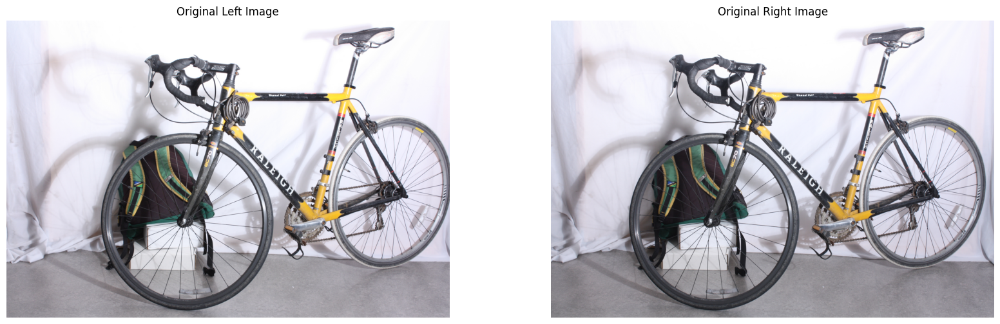

In [12]:
image_L = Image.open('./Question 2 and 3 Images/bikeL.png')
image_R = Image.open('./Question 2 and 3 Images/bikeR.png')

plt.figure(figsize=(20,6))

plt.subplot(1,2,1)
plt.imshow(image_L)
plt.axis('off')
plt.title('Original Left Image')

plt.subplot(1,2,2)
plt.imshow(image_R)
plt.axis('off')
plt.title('Original Right Image')

plt.show()

In [13]:
def scale(alpha,beta,img):
    max_val = -1
    min_val = float('inf')
    for i in img:
        for j in i:
            max_val = max(max_val,j)
            min_val = min(min_val,j)

    s = max_val - min_val

    for i in range(len(img)):
        for j in range(len(img[i])):
            img[i][j] = int(((img[i][j] - min_val)/s)*beta) + alpha
    
    return img

def calcDisparityAndDepthMaps(imageL,imageR):
    img1 = imageL.copy()
    img1 = np.array(img1.convert('L'))

    img2 = imageR.copy()
    img2 = np.array(img2.convert('L'))

    stereo = cv2.StereoBM_create(numDisparities=144, blockSize=23)
    b = baseline
    f = cam0[0][0]

    disparity_map = stereo.compute(img1,img2)

    depth_map = np.zeros((disparity_map.shape))

    for i in range(len(depth_map)):
        for j in range(len(depth_map[i])):
            if disparity_map[i][j]==0: # A point which doesn't have disparity
                depth_map[i][j] = depth_map[i][j-1]
            else:
                disparity_map[i][j] = abs(disparity_map[i][j])
                depth_ij = ((b*f)/disparity_map[i][j])
                depth_map[i,j] = depth_ij
    
    return disparity_map,depth_map

disparity_map,depth_map = calcDisparityAndDepthMaps(image_L,image_R)

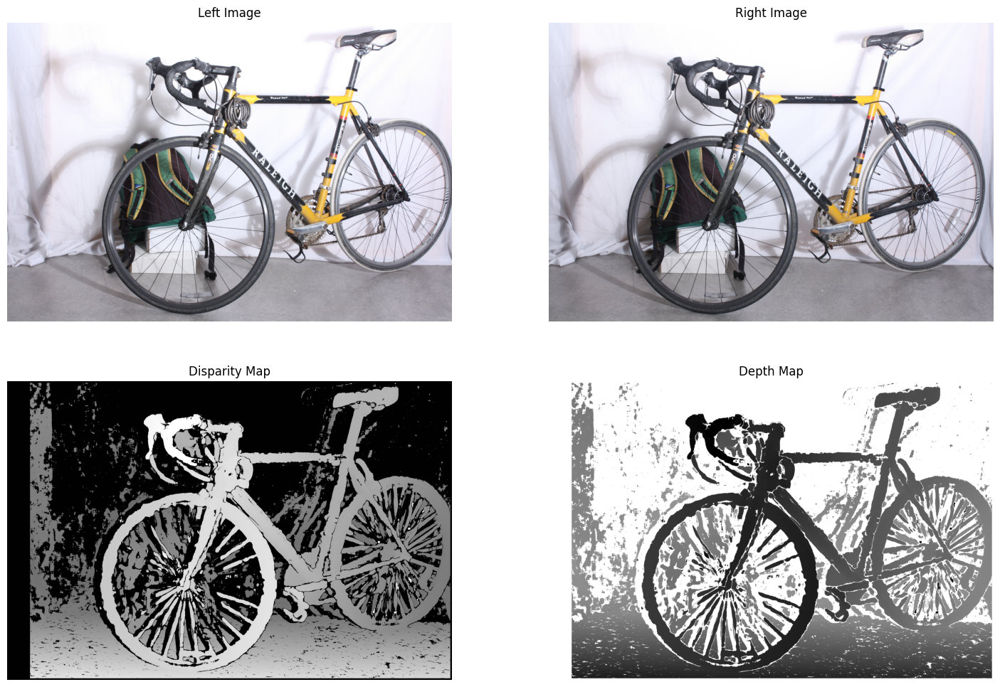

In [14]:
plt.figure(figsize=(18,12))

plt.subplot(2,2,1)
plt.imshow(image_L,'gray')
plt.axis('off')
plt.title('Left Image')

plt.subplot(2,2,2)
plt.imshow(image_R,'gray')
plt.axis('off')
plt.title('Right Image')

plt.subplot(2,2,3)
plt.imshow(disparity_map,'gray')
plt.axis('off')
plt.title('Disparity Map')

plt.subplot(2,2,4)
plt.imshow([[j**-1 for j in i] for i in depth_map],'gray_r')
plt.axis('off')
plt.title('Depth Map')

plt.show()

In [15]:
def transformInto3DCloud(points):
    # Making the point cloud in accordance to Left Camera

    X,Y,Z = [],[],[]
    ox,oy = cam0[0][2],cam0[1][2]
    fx,fy = cam0[0][0],cam0[1][1]

    for i in points:
        x = i[0]
        y = i[1]
        z = i[2]

        X.append( ((x-ox)*z)/fx )
        Y.append( ((y-oy)*z)/fy )
        Z.append( z )
    
    return X,Y,Z

points = []
(r,c) = np.array(depth_map).shape

for i in range(r):
    for j in range(c):
        points.append((i,j,round(depth_map[i][j],2)))

X,Y,Z = transformInto3DCloud(points)

In [16]:
points = {
    'X':X[::50],
    'Y':Y[::50],
    'Z':Z[::50]
}

Point Clouds

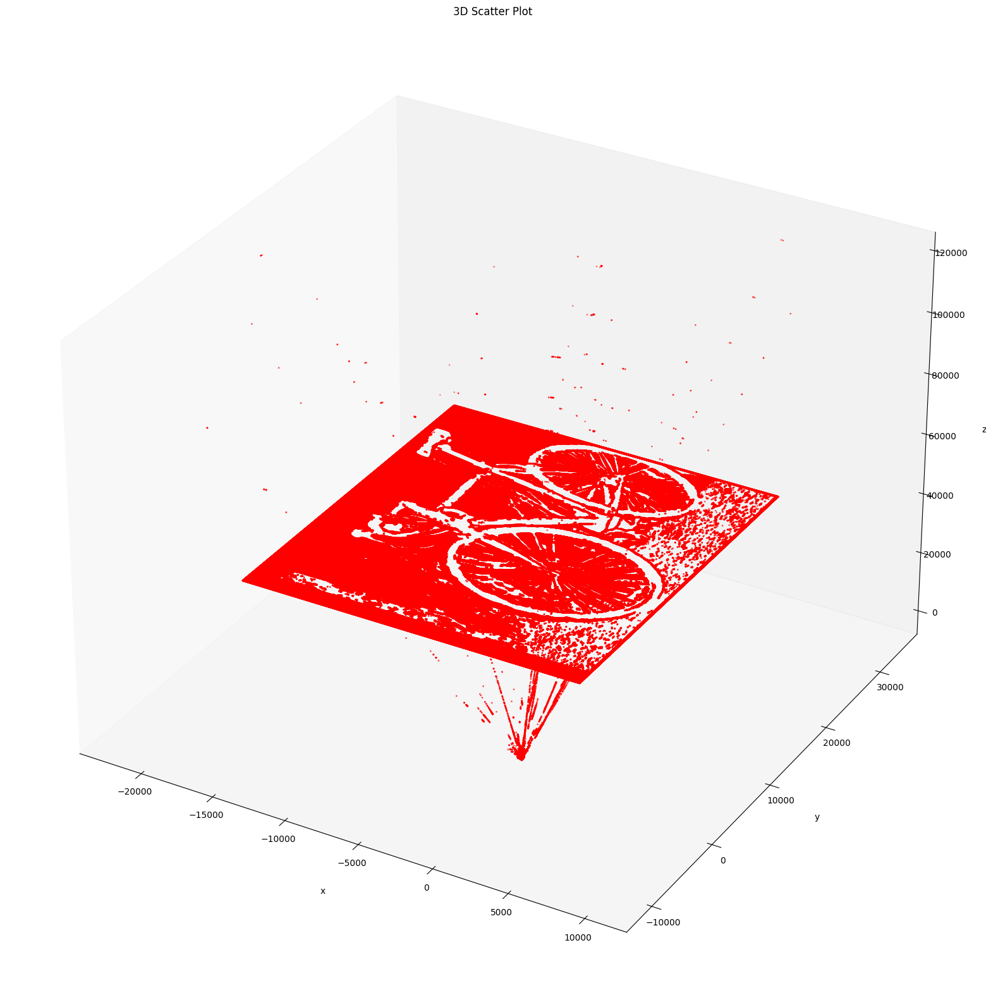

In [17]:
fig = plt.figure(figsize = (20,20))
ax = plt.axes(projection='3d')
ax.grid(visible=False)

ax.scatter(X, Y, Z, c = 'r', s = 1)
ax.set_title('3D Scatter Plot')

# Set axes label
ax.set_xlabel('x', labelpad=20)
ax.set_ylabel('y', labelpad=20)
ax.set_zlabel('z', labelpad=20)

plt.show()

In [18]:
df = pd.DataFrame(points)
fig = px.scatter_3d(df,x='X',y='Y',z='Z',color='Z')
fig.update_traces(marker=dict(size=2))
fig.show()